In [2]:

import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import Model
from matplotlib import pyplot
from numpy import expand_dims

     


In [3]:
#model
model = VGG16()

for i in range(len(model.layers)):
    layer = model.layers[i]
    if 'conv' not in layer.name:
        continue
    print(i,layer.name,layer.output.shape)

2023-02-27 00:48:21.949904: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:267] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-02-27 00:48:21.949974: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (picox): /proc/driver/nvidia/version does not exist
2023-02-27 00:48:21.969890: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1 block1_conv1 (None, 224, 224, 64)
2 block1_conv2 (None, 224, 224, 64)
4 block2_conv1 (None, 112, 112, 128)
5 block2_conv2 (None, 112, 112, 128)
7 block3_conv1 (None, 56, 56, 256)
8 block3_conv2 (None, 56, 56, 256)
9 block3_conv3 (None, 56, 56, 256)
11 block4_conv1 (None, 28, 28, 512)
12 block4_conv2 (None, 28, 28, 512)
13 block4_conv3 (None, 28, 28, 512)
15 block5_conv1 (None, 14, 14, 512)
16 block5_conv2 (None, 14, 14, 512)
17 block5_conv3 (None, 14, 14, 512)


In [4]:
model = Model(inputs=model.inputs,outputs=model.layers[4].output)     

model.summary()  


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
Total params: 112,576
Trainable params: 112,576
Non-trainable params: 0
_________________________________________________________________


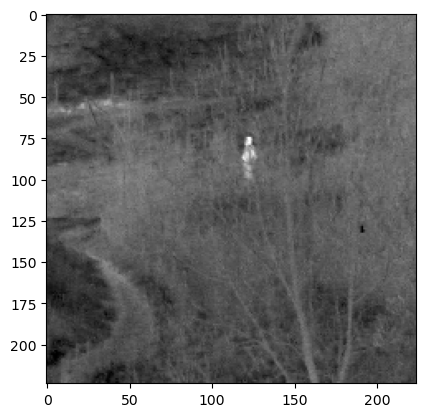

In [5]:
imgI = load_img('data/IR_18rad.bmp',target_size=(224,224))
pyplot.imshow(imgI)
imgI = img_to_array(imgI)

In [6]:
imgI = expand_dims(imgI, axis=0)
imgI = preprocess_input(imgI)
feature_mapsI= model.predict(imgI)

1/1 [==============================] - 1s 1s/step


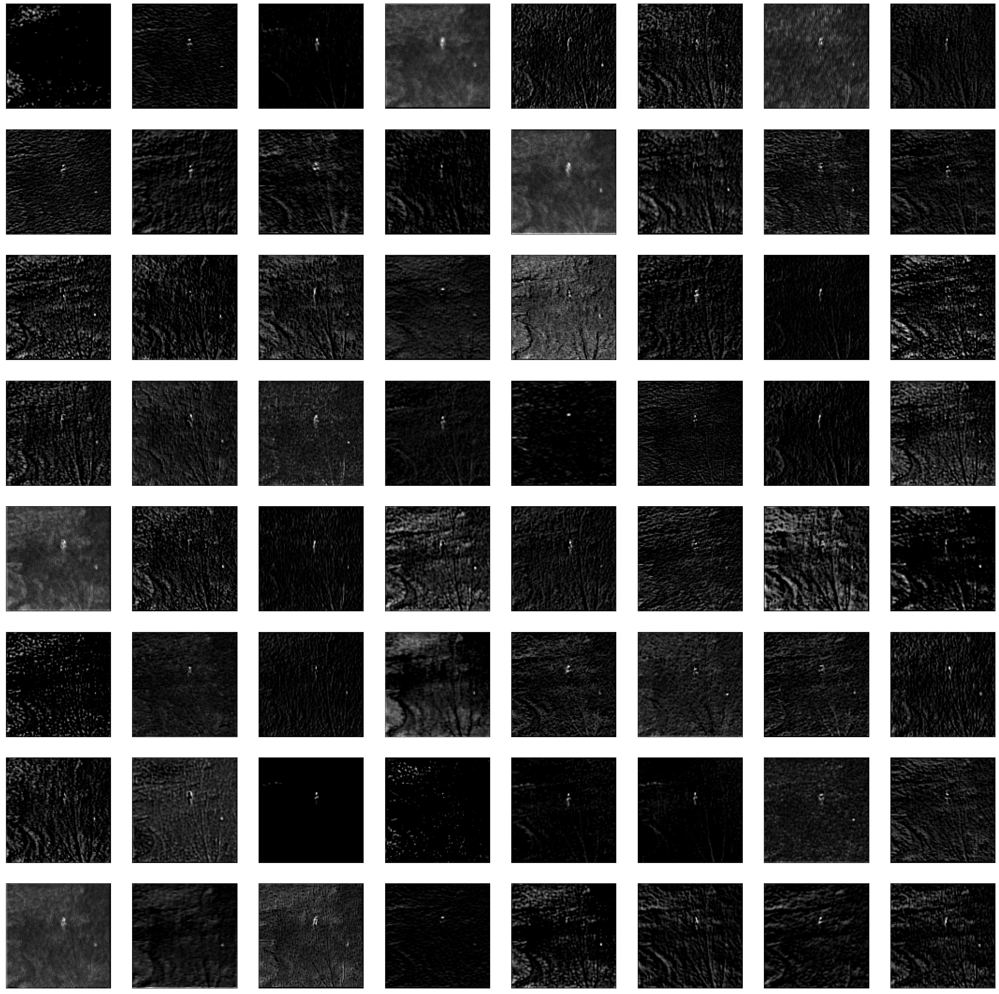

In [7]:

import matplotlib.pyplot as plt
plt.figure(figsize = (32, 32))
square = 8
ix =1
for _ in range(square):
    for _ in range(square):
        ax =pyplot.subplot(square,square,ix)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(feature_mapsI[0,:,:,ix-1],cmap='gray')
        ix+=1
pyplot.show()    
     


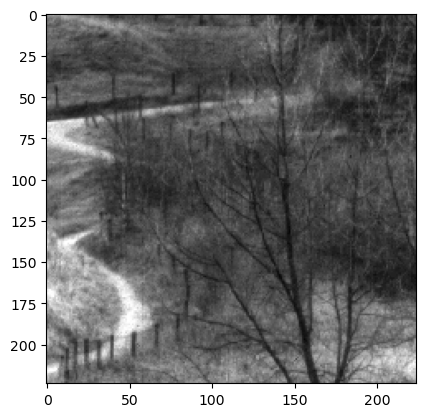

In [8]:
imgV = load_img('data/VIS_18dhvR.bmp',target_size=(224,224))
pyplot.imshow(imgV)
imgV = img_to_array(imgV)
     


In [9]:
imgV = expand_dims(imgV, axis=0)
imgV = preprocess_input(imgV)
feature_mapsV= model.predict(imgV)
     


1/1 [==============================] - 0s 47ms/step


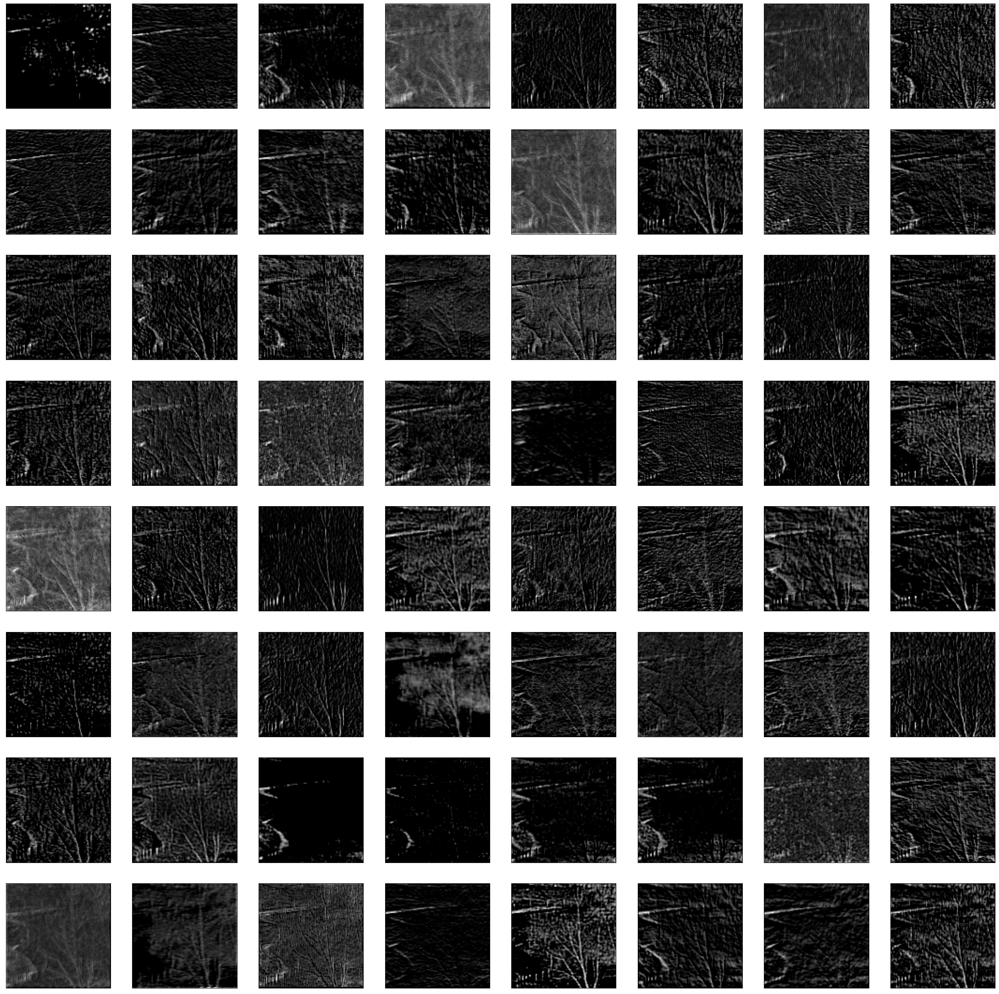

In [10]:
plt.figure(figsize = (32, 32))
square =8 
ix =1
for _ in range(square):
    for _ in range(square):
        ax =pyplot.subplot(square,square,ix)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(feature_mapsV[0,:,:,ix-1],cmap='gray')
        ix+=1
    
pyplot.show()    
     


In [11]:
import numpy as np
feature_mapsF = (feature_mapsI+feature_mapsV)/2
     
#feature_mapsF = np.max((feature_mapsI,feature_mapsV))

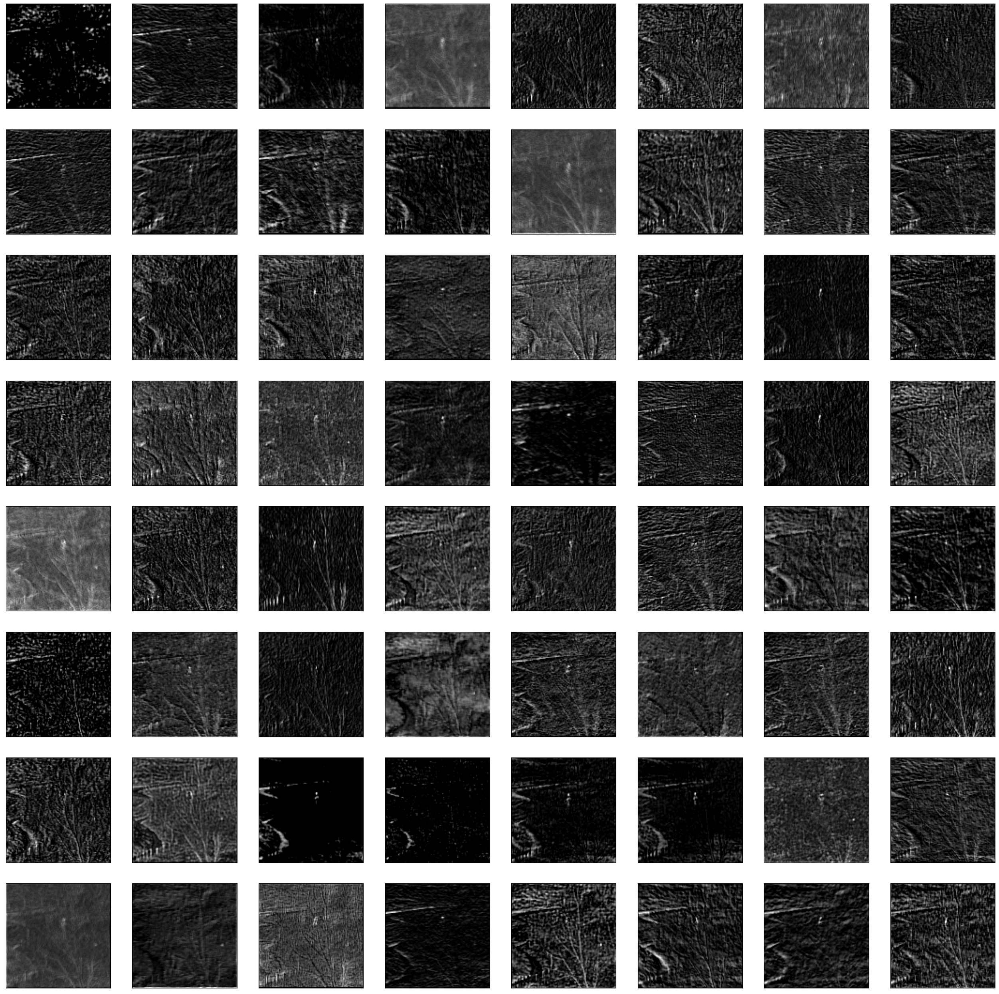

In [12]:
plt.figure(figsize = (32, 32))
square =8 
ix =1
for _ in range(square):
    for _ in range(square):
        ax =pyplot.subplot(square,square,ix)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(feature_mapsF[0,:,:,ix-1],cmap='gray')
        ix+=1
    
    
pyplot.show()
     


In [13]:
import tensorflow as tf
import numpy as np

def ssim_loss(img1, img2):
    size=11 
    sigma=1.5
    ssim_loss_value=tf.image.ssim(img1,img2,max_val=1,filter_size=11,filter_sigma=1.5,k1=0.01,k2=0.03)
    pixel_loss = tf.reduce_sum(tf.square(img1 - img2))
    ssim_loss = 1 - ssim_loss_value
    loss = 10*ssim_loss + pixel_loss
    return loss

In [14]:
####### Autoencder 
from keras.layers import Conv2D,Input
encode = VGG16(weights='imagenet')
x1 = Conv2D(64,(3,3),strides=(1,1),activation='relu',padding='same')(encode.layers[2].output)
x2 = Conv2D(32,(3,3),strides=(1,1),activation='relu',padding='same')(x1)
x3 = Conv2D(16,(3,3),strides=(1,1),activation='relu',padding='same')(x2)
x4 = Conv2D(8,(3,3),strides=(1,1),activation='relu',padding='same')(x3)
decode = Conv2D(3,(3,3),strides=(1,1),activation='relu',padding='same')(x4)

In [15]:
autoencoder = Model(encode.layers[0].input, decode)
     
decode.shape
encode.layers[0].input.shape




TensorShape([None, 224, 224, 3])

In [16]:
autoencoder.compile(optimizer='adam',loss=ssim_loss,metrics=['accuracy'])
     
autoencoder.summary()
     

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      36928     
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      18464     
                                                                 
 conv2d_2 (Conv2D)           (None, 224, 224, 16)      4624      
                                                                 
 conv2d_3 (Conv2D)           (None, 224, 224, 8)       1160

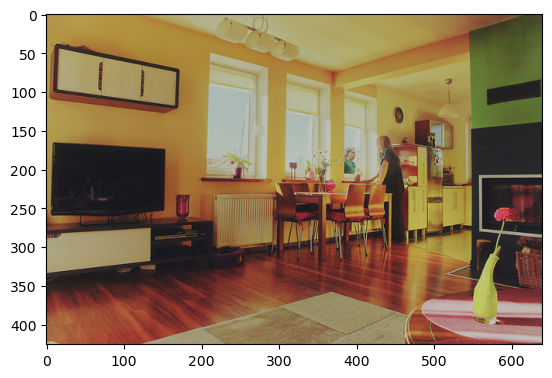

In [19]:
import cv2
from PIL import Image
im = Image.open('data/cocoa/000000000139.jpg')
plt.imshow(im)
plt.show()


In [31]:
X=[]
import os 
for img in os.listdir('data/cocoa/'):
    c = cv2.imread('data/cocoa/'+img)
    c = cv2.resize(c,(224,224))
    X.append(c)

In [ ]:
X = np.array(X).reshape(-1,224,224,3)


In [ ]:
autoencoder.fit(X,X,epochs=10,batch_size=8,  shuffle=True, validation_data=(X, X)) 

In [ ]:
imgI = load_img('data/thermal/7400i.bmp', target_size=(224,224))
pyplot.imshow(imgI)
imgI = img_to_array(imgI)
imgI = expand_dims(imgI, axis=0)
imgI = preprocess_input(imgI)
 
pimg=autoencoder.predict(imgI)
pyplot.imshow(pimg[0,:,:,2],cmap='gray')

In [ ]:
imgV = load_img('data/visual/7400v.bmp',target_size=(224,224))
pyplot.imshow(imgV)
imgV = img_to_array(imgV)

imgV = expand_dims(imgV, axis=0)
imgV = preprocess_input(imgV)

vimg=autoencoder.predict(imgV)
pyplot.imshow(vimg[0,:,:,1],cmap='gray')

In [ ]:
encoder = Model(inputs=autoencoder.layers[0].input,outputs=autoencoder.layers[2].output)

In [ ]:
IMGVE = encoder.predict(imgV)
IMGIE = encoder.predict(imgI)
IMGVF = (IMGVE+IMGIE)/2
     

In [ ]:
#creating the Decoder 
from keras.models import Sequential
m = Sequential()
for layer in autoencoder.layers[3:]:
    m.add(layer)

In [ ]:
fuse=m.predict(IMGVF) 
pyplot.imshow(fuse[0,:,:,2],cmap='gray')

In [ ]:
autoencoder.save_weights("autoencoder.h5")